![Astrofisica Computacional](../../logo.PNG)

---
## 37. Animación del movimiento de un Cometa

Eduard Larrañaga (ealarranaga@unal.edu.co)

---


### Resumen

A partir de los datos obtenidos en ejercicios previos, se visualizará en forma de animación el movimiento orbital de un cometa alrededor del Sol.


---

## El Sistema Cometa-Sol

En este cuaderno se utilizarán los datos obtenidos en la descripción 2-dimensional del movimiento orbital de un cometa alrededor del Sol, almacenados en el archivo `'comet_orbit.txt'`.

El sistema de unidades de medida será

- unidad de masa: masa Solar $(M_{\odot})$
- unidad de distancia: Unidad Astronómica $(\text{ au})$
- unidad de tiemo: año $(yr)$


In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Read and unpack the data from the file.
# The format includes coordinates and velocities: x y vx vy
x, y, vx, vy = np.loadtxt('comet_orbit.txt', unpack=True)

In [3]:
x.shape

(500000,)

---
## Gráfico Simple 2D

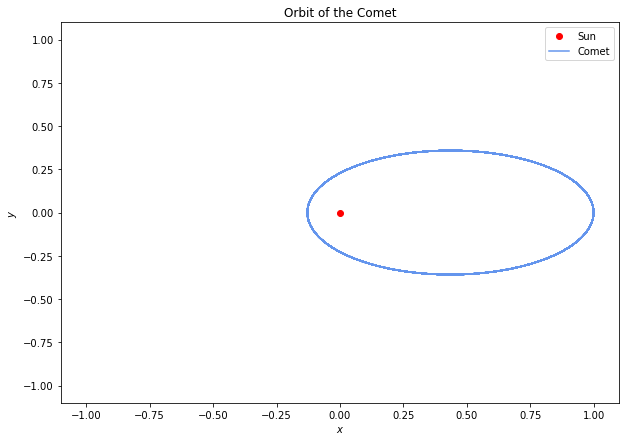

In [6]:

# Boundaries of the plot
boundary = max(abs(np.max(x)), abs(np.min(x)), abs(np.max(y)), abs(np.min(y)))*1.1

fig, ax = plt.subplots(1,1, figsize=(10,7))
ax.plot(0., 0., 'ro', label = 'Sun')
ax.plot(x, y, color='cornflowerblue', label=f'Comet')
ax.set_title('Orbit of the Comet')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
ax.set_xlim(-boundary,boundary)
ax.set_ylim(-boundary,boundary)
ax.legend()


plt.show()

---

## Creando la Animación

Con el fin de crear la animación se utilizará la función [matplotlib.animation](https://matplotlib.org/stable/api/animation_api.html).

Para visualizar la animación creada en el cuaderno de jupyter, se utilizará la función [IPython.display.HTML](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html)

In [7]:
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

Primero, se crea el escenario para trabajar como una figura y un conjunto de ejes. Notese que se define la creación de una línea `line1`, un punto `pt1` y el titulo `txt_title` que cambiarán en cada frame. Adicionalmente se crea un punto fijo (no cambiara en la animación) `pt2` que representa al Sol.

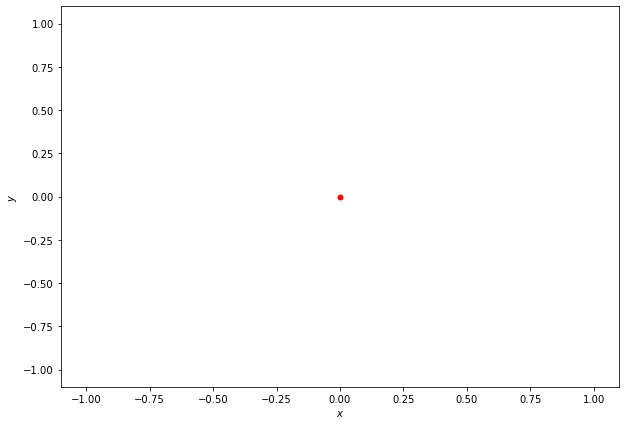

In [8]:
# create a figure and axes
fig, ax = plt.subplots(figsize=(10,7))
ax.set_xlim(-boundary, boundary)
ax.set_ylim(-boundary, boundary)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')

# Create objects that will change in the animation. These are
# initially empty, and will be given new values for each frame
# in the animation.

# Defines the characteristics of the ploted line (size=2)
line1, = ax.plot([], [], lw=2) 
# Defines the characteristics of the ploted point (size=5)
pt1, = ax.plot([], [], 'bo', ms=5)
# Defines the plot's title
txt_title = ax.set_title('')

# Defines the location of the Sun
pt2, = ax.plot(0., 0., 'ro', ms=5)

In [9]:
# Total number of frames
N = len(x)
N

500000

Ahora se define la función que se encargará de dibujar cada frame con los datos. En esta función se definen los objetos a animar en cada frame: `line1`, `pt1` y `txt_title`. La variable `i` denota el número de frame que se está dibujando.

In [10]:
def animate(i):
    x_data = x[0:100*i] # We draw from the initial point up to the point 100*i
    y_data = y[0:100*i] # We draw from the initial point up to the point 100*i
    line1.set_data(x_data, y_data)
    pt1.set_data(x[100*i],y[100*i]) # Draws a point at the comet's position
    txt_title.set_text('Frame = {0:4d}'.format(i))
    return (line1, pt1,)

La función [matplotlib.animation.FuncAnimation](https://matplotlib.org/stable/api/_as_gen/matplotlib.animation.FuncAnimation.html) creará la animación por frames. En esta ocasión se crearán 500 frames con una duración de 20 ms cada uno. El argumento `blit:True` define que en cada frame solo se re-dibujarán las partes que han cambiado y el resto se mantiene igual.

El resultado de esta función es un objeto denominado `anim` que contiene la información de cada frame de animación.

In [11]:
anim = animation.FuncAnimation(fig, animate, 
                               frames=500, interval=20,  # only 500 frames with a duration of 20 ms each
                               blit=True)
# blit=True re-draws only the parts that have changed.

In [14]:
anim

Para visualizar la animación, se debe transoformar el objeto `anim` en otro formato, como por ejemplo un video jshtml,

In [15]:
HTML(anim.to_jshtml())

o también ser puede crear un video de html5 utilizando

In [16]:
HTML(anim.to_html5_video())

---
## Modificación de la animación 

En esta modificación dibujaremos solo parte de la trayectoria en cada frame, con el fin de hacer notar el cambio en la velocidad en cada punto de la orbita.

In [17]:
def animate(i):
    x_data = x[100*i-1000:100*i] # We draw from the initial point up to the point 100*i
    y_data = y[100*i-1000:100*i] # We draw from the initial point up to the point 100*i
    line1.set_data(x_data, y_data)
    pt1.set_data(x[100*i],y[100*i]) # Draws a point at the comet's position
    txt_title.set_text('Frame = {0:4d}'.format(i))
    return (line1, pt1,)

anim = animation.FuncAnimation(fig, animate, 
                               frames=500, interval=20,  # only 500 frames with a duration of 20 each
                               blit=True)
# blit=True re-draws only the parts that have changed.

In [18]:
HTML(anim.to_jshtml())